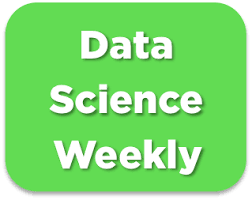

# **Challenge : predict conversions** 🏆🏆

# Import libraries

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import classification_report, accuracy_score,recall_score,precision_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.compose import ColumnTransformer


import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns

from IPython.display import display
plt.style.use('ggplot')

# Read file with labels

In [ ]:
data = pd.read_csv('/content/conversion_data_train.csv')
print('Set with labels (our train+test) :', data.shape)

Set with labels (our train+test) : (284580, 6)


In [ ]:
data.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


# **Explore dataset**

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284580 entries, 0 to 284579
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              284580 non-null  object
 1   age                  284580 non-null  int64 
 2   new_user             284580 non-null  int64 
 3   source               284580 non-null  object
 4   total_pages_visited  284580 non-null  int64 
 5   converted            284580 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 13.0+ MB


In [ ]:
data.describe(include='all')

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [ ]:
# View missing values
data.isna().sum() / len(data) * 100

,0
country,0.0
age,0.0
new_user,0.0
source,0.0
total_pages_visited,0.0
converted,0.0


## Part 1 :  Data exploration

In [ ]:
df=data.copy()

## 1.1 Data Distribution

In [ ]:
# Age  distribution
fig = px.box(
    df,
    y="age",
    title="Age Distribution (Boxplot)",
    width=500
)

fig.update_layout(
    title_x=0.5,  # centrer le titre
    yaxis_title="Age"
)

fig.show()

In [ ]:
## Data Cleaning : Impute with median age
median_age = df["age"].median()
df.loc[df["age"] > 80, "age"] = median_age

# Age  distribution
fig = px.box(
    df,
    y="age",
    title="Age Distribution (Boxplot)",
    width=500
)

fig.update_layout(
    title_x=0.5,  # centrer le titre
    yaxis_title="Age"
)

fig.show()

The median is around 30 years.

The dataset is young-adult dominated (20s–30s).

A few unrealistic ages should be cleaned.

Age may be predictive: younger vs older users might behave differently in conversion.

There are outliers, we will impute ages that are above 80 years old.

In [ ]:
# Country distribution

fig = px.pie(
    df,
    names='country',
    hole=0.4,
    width=600
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.1 if i == 0 else 0 for i in range(df['country'].nunique())]
)

fig.update_layout(
    title={
        'text': 'Country Distribution',
        'x': 0.5,   # center horizontally
        'xanchor': 'center',
        'yanchor': 'top'
    },
    showlegend=False
)

fig.show()

What we see

- US dominates the dataset: 56% of users.
- China: ~24% → the second largest group.
- UK: ~15%.
- Germany: ~4% (very underrepresented).



In [ ]:
# New user distribution

fig = px.pie(
    df,
    names='new_user',
    hole=0.4,
    width=600
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.1 if i == 0 else 0 for i in range(df['new_user'].nunique())]
)

fig.update_layout(
    title={
        'text': 'New User Distribution',
        'x': 0.5,   # center horizontally
        'xanchor': 'center',
        'yanchor': 'top'
    },
    showlegend=False
)

fig.show()

- 1 (New User = Yes) → ~68% of the users are new visitors.

- 0 (New User = No) → ~32% are returning visitors.


SEO is the largest source of traffic → 49% of users arrive via search engines.

Ads represent about 28% of the traffic → a significant portion, which likely comes at a financial cost.

Direct traffic (users typing the URL or from bookmarks) makes up 23%. These are usually loyal or returning visitors.

In [ ]:
# Source distribution

fig = px.pie(
    df,
    names='source',
    hole=0.4,
    width=600
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.1 if i == 0 else 0 for i in range(df['source'].nunique())]
)

fig.update_layout(
    title={
        'text': 'Source Distribution',
        'x': 0.5,   # center horizontally
        'xanchor': 'center',
        'yanchor': 'top'
    },
    showlegend=False
)

fig.show()

In [ ]:
# Total Pages Visited Distribution
fig = px.histogram(
    df,
    x="total_pages_visited",
    nbins=30,
    title="Distribution of Total Pages Visited",
    width=600
)

fig.update_layout(
    title_x=0.5,
    xaxis_title="Total Pages Visited",
    yaxis_title="Count"
)

fig.show()

**What we see in total_pages_visited:**

- Most users visit only a few pages → the peak is around 2–4 pages.

- As the number of pages visited increases, the count of users drops very fast.

- Only a tiny fraction of users visit more than ~15–20 pages.

This is a right-skewed distribution (long tail on the right). That’s super common in web behavior data → most people bounce quickly, a few explore a lot.

In [ ]:
# Total Pages Visited Distribution
fig = px.box(
    df,
    y="total_pages_visited",
    title="Total Pages Visited (Boxplot)",
    width=500
)

fig.update_layout(title_x=0.5, yaxis_title="Total Pages Visited",width=500)
fig.show()

In [ ]:
# Target Distribution
converted_counts = df['converted'].value_counts().reset_index()
converted_counts.columns = ['converted', 'count']
converted_counts['percentage'] = converted_counts['count'] / converted_counts['count'].sum() * 100

fig = px.pie(
    converted_counts,
    names='converted',
    values='count',
    hole=0,
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.1 if i == 0 else 0 for i in range(len(converted_counts))]
)

fig.update_layout(
    title='Target Distribution',
    showlegend=False,
    title_x=0.5
)

fig.show()

Highly imbalanced dataset → 96.8% non-converted vs only 3.2% converted.

Conversions are a rare event (≈ 1 out of 30 users).

## Target Distribution: Numeric variables

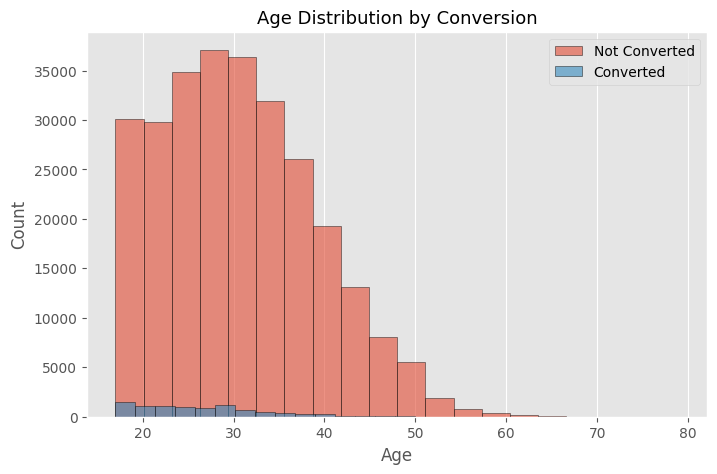

In [ ]:
# Age distribution by target
plt.figure(figsize=(8,5))
plt.hist(df[df["converted"]==0]["age"], bins=20, alpha=0.6, label="Not Converted", edgecolor="black")
plt.hist(df[df["converted"]==1]["age"], bins=20, alpha=0.6, label="Converted", edgecolor="black")
plt.title("Age Distribution by Conversion",fontsize=13)
plt.xlabel("Age")
plt.ylabel("Count")
plt.grid(axis='y')
plt.legend()
plt.show()

**Age Distribution by Conversion**

- Most users (converted or not) are between ~20 and 40 years old

This age group dominates the dataset.

The conversion pattern follows the overall user distribution.

- Conversions happen mainly in the 20–40 range too

Converted users (blue) are most common in the same bracket.

This suggests that age itself may not be the strongest predictor, but it still aligns with the core audience.

- Older users (>50)

Very few users are in this range.

Conversions are almost nonexistent there → but sample size is also small.

In [ ]:
# Total Pages Visited distribution by target
fig = px.box(
    df,
    x="converted",                # target (0 or 1)
    y="total_pages_visited",      # numeric variable
    color="converted",            # add color for clarity
    title="Total Pages Visited by Conversion Status",
    width=700
)

fig.update_layout(
    title_x=0.5,
    xaxis_title="Converted (0 = No, 1 = Yes)",
    yaxis_title="Total Pages Visited"
)

fig.show()

## Target Distribution: Categorical variables

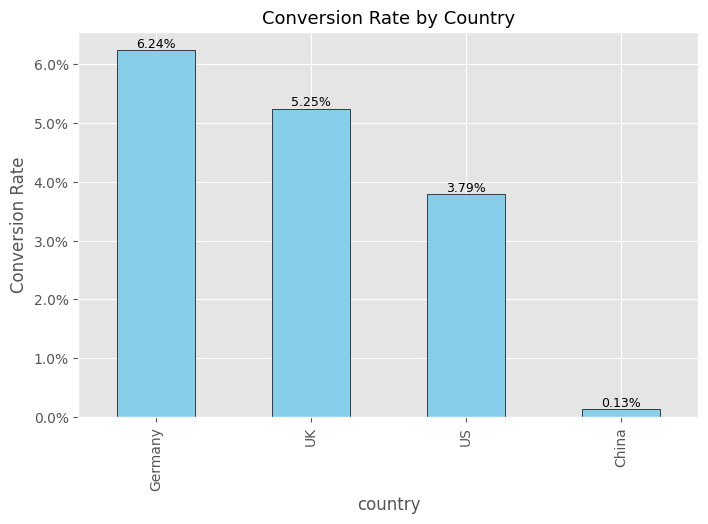

In [ ]:
# Conversion rate by country
conv_by_country = df.groupby("country")["converted"].mean().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(8,5))
bars = conv_by_country.plot(kind="bar", color="skyblue", edgecolor="black", ax=ax)

# Format y-axis as percent
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Add % on top of bars
for i, v in enumerate(conv_by_country):
    ax.text(i, v + 0.000, f"{v:.2%}", ha="center", va="bottom", fontsize=9)

plt.title("Conversion Rate by Country",fontsize=13)
plt.ylabel("Conversion Rate")
plt.show()


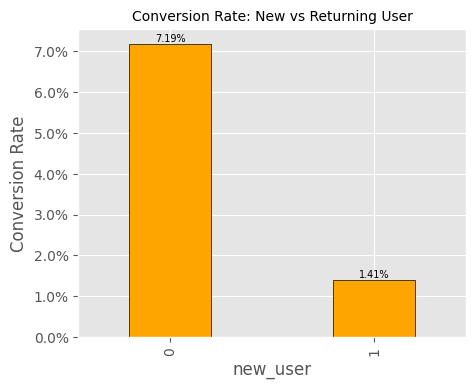

In [ ]:
# Conversion rate by new_user
conv_by_new = df.groupby("new_user")["converted"].mean()

fig, ax = plt.subplots(figsize=(5,4))
bars = conv_by_new.plot(kind="bar", color="orange", edgecolor="black", ax=ax, width=0.40)

# Format y-axis as percent
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

for i, v in enumerate(conv_by_new):
    ax.text(i, v + 0.000, f"{v:.2%}", ha="center", va="bottom", fontsize=7)


plt.title("Conversion Rate: New vs Returning User",fontsize=10)
plt.ylabel("Conversion Rate")
plt.show()


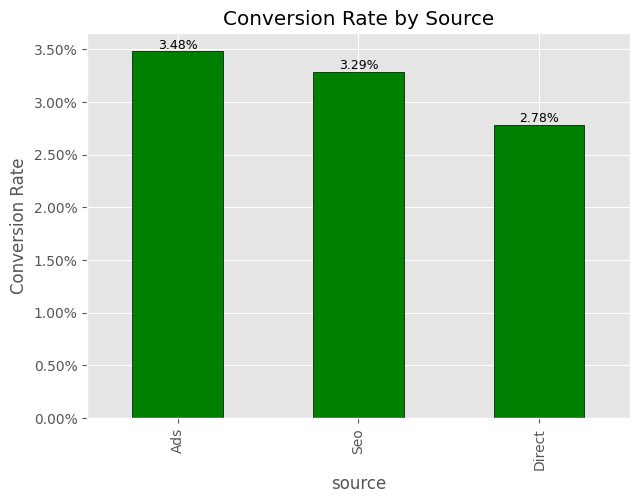

In [ ]:
# Conversion rate by source
conv_by_source = df.groupby("source")["converted"].mean().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(7,5))
bars = conv_by_source.plot(kind="bar", color="green", edgecolor="black", ax=ax)

# Format y-axis as percent
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

for i, v in enumerate(conv_by_source):
    ax.text(i, v + 0.000, f"{v:.2%}", ha="center", va="bottom", fontsize=9)

plt.title("Conversion Rate by Source")
plt.ylabel("Conversion Rate")
plt.show()

**Conversion Rate by Source**

- Ads: highest conversion rate at 3.48%.

Even though ads are paid traffic, they seem to attract users who are more likely to subscribe.

- SEO: second place with 3.29%.

Organic search brings a lot of volume and a solid conversion rate → a reliable channel.

- Direct: lowest at 2.78%.

Returning/loyal visitors don’t convert as much as expected. Maybe they are browsing without strong intent, or they’ve already subscribed.

##Correlation Analysis

In [ ]:
df1 =df.copy()

In [ ]:
corr_matrix= df1.corr(numeric_only=True)

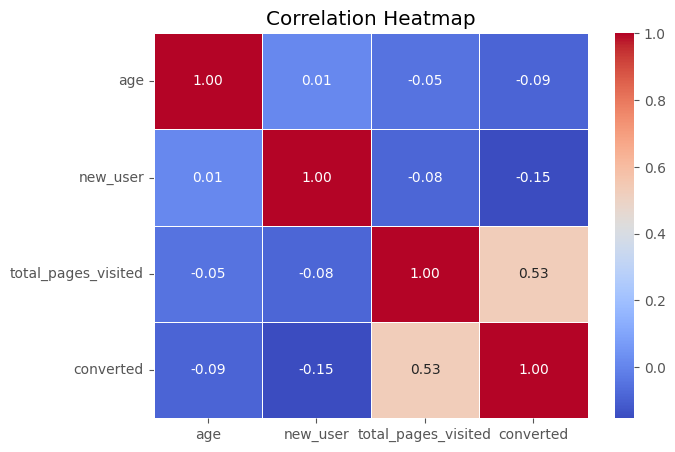

In [ ]:
#Correlation Heatmap
plt.figure(figsize=(7, 5))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Pages visited: key factor (+0.53) → more pages = more conversions.

New users: convert less (-0.15).

Age: very weak impact (-0.09).

No multicollinearity: each variable adds complementary information.

Conclusion: the number of pages visited is the main driver of conversion.

## Data Cleaning:

In [ ]:
# let's remove the outliers in the Age column
# Find Q1, Q3 and IQR
Q1 = df1['age'].quantile(0.25)
Q3 = df1['age'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = (df1['age'] < Q1 - 1.5 * IQR) | (df1['age'] > Q3 + 1.5 *IQR)

In [ ]:
# Remove outliers
cleaned_data = df1[~outliers]
print('Data shape:', cleaned_data.shape)

Data shape: (283213, 6)


In [ ]:
fig = px.box(cleaned_data.melt(value_vars='age',
                                     var_name='Feature',
                                     value_name='Value'),
             y='Value',
             color='Feature',
             facet_col='Feature',
             title='Age')

fig.update_layout(height=400, width=400, showlegend=False)
fig.show(renderer='colab')



In [ ]:
#Save cleaned data
cleaned_data.to_csv('/content/cleaned_data.csv', index=False)

#**Machine Learning**

In [ ]:
# Create function to plot confusion matrices
def plot_confusion_matrix(y_train, y_train_pred, y_test, y_test_pred,
                             class_labels=None, titles=("Train Set", "Test Set"),
                             figsize=(12, 5), cmap='Blues'):
    """
    Plot side-by-side confusion matrices for train and test sets.

    Parameters:
    - y_train, y_train_pred: true and predicted labels for train set
    - y_test, y_test_pred: true and predicted labels for test set
    - class_labels: list of class label names (default: numeric labels)
    - titles: tuple of titles for the train/test plots
    - figsize: figure size (default: (12, 5))
    - cmap: colormap for heatmap (default: 'Blues')
    """

    cm_train = confusion_matrix(y_train, y_train_pred)
    cm_test = confusion_matrix(y_test, y_test_pred)

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    for cm, ax, title in zip([cm_train, cm_test], axes, titles):
        sns.heatmap(cm, annot=True, fmt='d', cmap=cmap,
                    xticklabels=class_labels, yticklabels=class_labels, ax=ax)
        ax.set_title(f"{title} Confusion Matrix")
        ax.set_xlabel("Predicted Labels")
        ax.set_ylabel("True Labels")

    plt.tight_layout()
    plt.show()

##Create Univariate Baseline Model

**From the EDA, we know that the most useful feature is total_pages_visited. Let's create a baseline model by using at first only this feature : in the next cells, we'll make preprocessings and train a simple (univariate) logistic regression.**

In [ ]:
df2 = pd.read_csv('/content/cleaned_data.csv')

In [ ]:
features_list = ['total_pages_visited']
numeric_indices = [0]
categorical_indices = []
target_variable = 'converted'

In [ ]:
X = df2.loc[:, features_list]
Y = df2.loc[:, target_variable]

print('Explanatory variables : ', X.columns)
print()

Explanatory variables :  Index(['total_pages_visited'], dtype='object')



In [ ]:
# Divide dataset Train set & Test set
print("Dividing into train and test sets...")
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



## Training pipeline

In [ ]:
# Preprocessing
print("Encoding categorical features and standardizing numerical features...")

featureencoder = StandardScaler()
X_train = featureencoder.fit_transform(X_train)
print("...Done")
print(X_train[0:5,:])

Encoding categorical features and standardizing numerical features...
...Done
[[-0.26159205]
 [ 0.93562063]
 [-0.56089522]
 [ 0.33701429]
 [ 0.63631746]]


In [ ]:
# Train model
print("Train model...")
classifier = LogisticRegression()
classifier.fit(X_train, y_train)
print("...Done.")

Train model...
...Done.


In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]



## Test pipeline

In [ ]:
# Use X_test, and the same preprocessings as in training pipeline,
# but call "transform()" instead of "fit_transform" methods (see example below)

print("Encoding categorical features and standardizing numerical features...")

X_test = featureencoder.transform(X_test)
print("...Done")
print(X_test[0:5,:])

Encoding categorical features and standardizing numerical features...
...Done
[[ 0.03771112]
 [-0.56089522]
 [-0.26159205]
 [ 1.2349238 ]
 [-0.56089522]]


In [ ]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



## Performance assessment

In [ ]:
# WARNING : Use the same score as the one that will be used by Kaggle !
# Here, the f1-score will be used to assess the performances on the leaderboard
print("f1-score on train set : ", f1_score(y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(y_test, Y_test_pred))
print("Classification Report Test:\n", classification_report(y_test, Y_test_pred))

f1-score on train set :  0.6947867298578199
f1-score on test set :  0.6984815618221258
Classification Report Test:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     54763
           1       0.84      0.60      0.70      1880

    accuracy                           0.98     56643
   macro avg       0.91      0.80      0.84     56643
weighted avg       0.98      0.98      0.98     56643



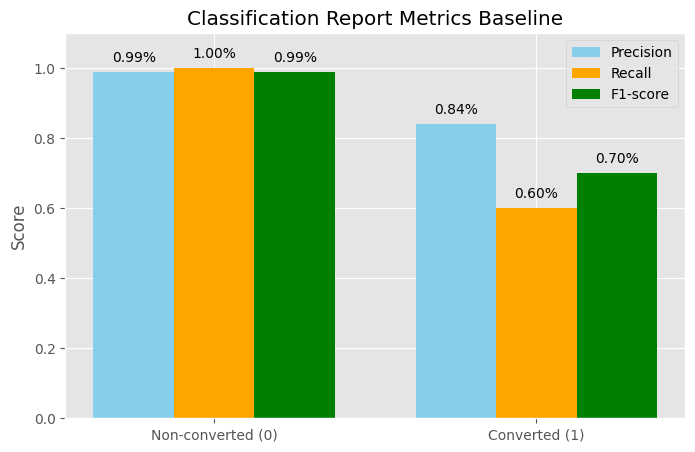

In [ ]:
# Metrics
classes = ["Non-converted (0)", "Converted (1)"]
precision = [0.99, 0.84]
recall = [1.00, 0.60]
f1 = [0.99, 0.70]

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(8,5))

# bars
bars1 = ax.bar(x - width, precision, width, label="Precision", color="skyblue")
bars2 = ax.bar(x, recall, width, label="Recall", color="orange")
bars3 = ax.bar(x + width, f1, width, label="F1-score", color="green")

# labels and layout
ax.set_ylabel("Score")
ax.set_title("Classification Report Metrics Baseline")
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.set_ylim(0, 1.1)
ax.legend()

# show values above bars without overlap
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.02,
            f"{height:.2f}%",
            ha="center", va="bottom", fontsize=10
        )

plt.show()



In [ ]:
# Check performance metrics to better understand the model
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, Y_test_pred))
print()

Confusion matrix on train set : 
[[218308    970]
 [  2894   4398]]

Confusion matrix on test set : 
[[54543   220]
 [  753  1127]]



##Confusion Matrices

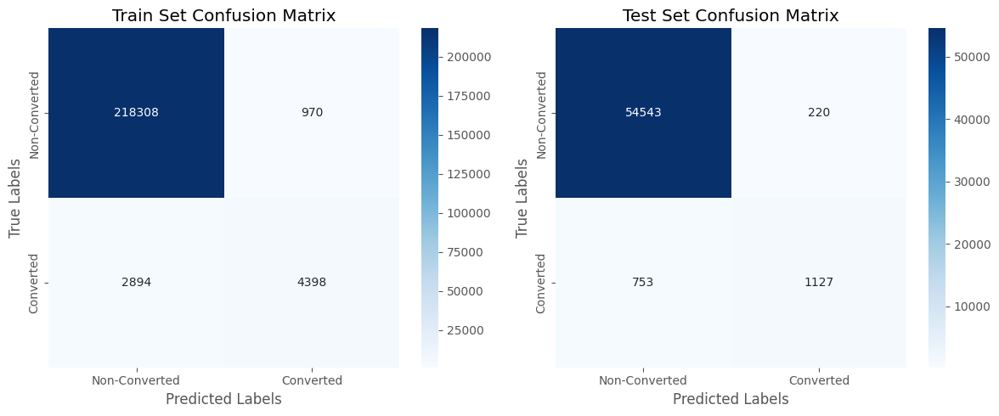

In [ ]:
plot_confusion_matrix(
    y_train, Y_train_pred,
    y_test, Y_test_pred,
    class_labels=["Non-Converted", "Converted"]
)

**Our baseline model reaches a f1-score of almost 70%. Now, let's train another model and add more features and try to beat this score ! 🚀🚀**

#**Part 2 : Improve model's f1-score**

### **Train best classifier on all data and use it to make predictions on X_without_labels**
Before making predictions on the file conversion_data_test.csv, let's train our model on ALL the data that was in conversion_data_train.csv. Sometimes, this allows to make tiny improvements in the score because we're using more examples to train the model.

##Preprocessing

In [ ]:
df2 = pd.read_csv('/content/cleaned_data.csv')

In [ ]:
print("Separate target from features...\n")
target_variable = 'converted'

x = df2.drop(target_variable, axis=1)
y = df2.loc[:, target_variable]

print(x.info())

Separate target from features...

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283213 entries, 0 to 283212
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   country              283213 non-null  object
 1   age                  283213 non-null  int64 
 2   new_user             283213 non-null  int64 
 3   source               283213 non-null  object
 4   total_pages_visited  283213 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 10.8+ MB
None


In [ ]:
# Automatically detect numeric and categorical columns

numeric_features = x[['age', 'new_user', 'total_pages_visited']]
categorical_features = x[['country', 'source']]

print(" Found numeric features:", numeric_features)
print("Found categorical features:", categorical_features)

 Found numeric features:         age  new_user  total_pages_visited
0        22         1                    2
1        21         1                    3
2        20         0                   14
3        23         1                    3
4        28         1                    3
...     ...       ...                  ...
283208   36         1                    1
283209   31         1                    2
283210   41         1                    5
283211   31         1                    4
283212   26         0                    3

[283213 rows x 3 columns]
Found categorical features:         country  source
0         China  Direct
1            UK     Ads
2       Germany     Seo
3            US     Seo
4            US  Direct
...         ...     ...
283208       US     Ads
283209       US     Seo
283210       US     Seo
283211       US  Direct
283212       US     Ads

[283213 rows x 2 columns]


In [ ]:
print('Divide dataset into train and test sets..')
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42,stratify =y)

Divide dataset into train and test sets..


##**Pipeline**

In [ ]:
# Define the list of numeric and categorical features
numeric_features = ['age', 'new_user', 'total_pages_visited']
categorical_features = ['country', 'source']

# Define preprocessing for numeric features
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Define preprocessing for categorical features
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder())
])

# Define the preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

In [ ]:
# Apply preprocessing to the train and test sets
print("Preprocessing train set...")
X_train = preprocessor.fit_transform(X_train)
print("Preprocessing test set...")
X_test = preprocessor.transform(X_test)

Preprocessing train set...
Preprocessing test set...


##1. **Feature Engineering : Logistic Regression Model**

##Training

In [ ]:
# Train model
logreg_clf = LogisticRegression(max_iter=1000)

print("Train model...")
logreg_clf = LogisticRegression()
logreg_clf.fit(X_train, y_train)
print("...Done.")

Train model...
...Done.


In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred_logreg = logreg_clf.predict(X_train)
print("...Done.")
print(Y_train_pred_logreg)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]



##Testing

In [ ]:
print("Predictions on Test set...")
Y_test_pred_logreg = logreg_clf.predict(X_test)
print("...Done.")
print(Y_test_pred_logreg)

Predictions on Test set...
...Done.
[0 0 0 ... 0 0 0]


##Performance

In [ ]:
print("f1-score on train set : ", f1_score(y_train, Y_train_pred_logreg))
print("f1-score on test set : ", f1_score(y_test, Y_test_pred_logreg))
print("Classification Report:\n", classification_report(y_test, Y_test_pred_logreg))

f1-score on train set :  0.7631122179458154
f1-score on test set :  0.7677070828331333
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     54809
           1       0.85      0.70      0.77      1834

    accuracy                           0.99     56643
   macro avg       0.92      0.85      0.88     56643
weighted avg       0.99      0.99      0.99     56643



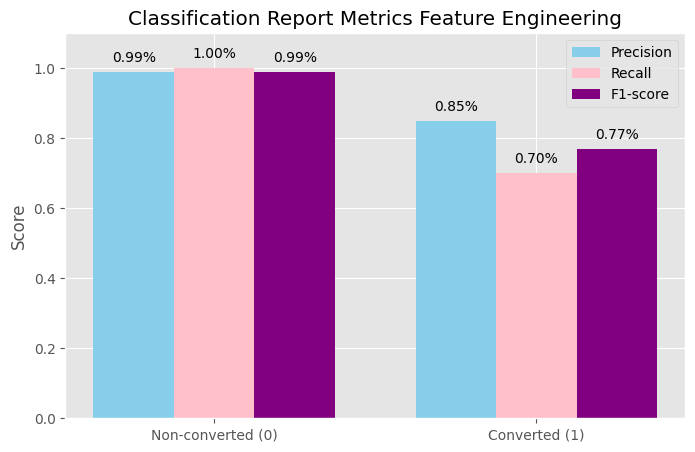

In [ ]:
# Metrics
classes = ["Non-converted (0)", "Converted (1)"]
precision = [0.99, 0.85]
recall = [1.00, 0.70]
f1 = [0.99, 0.77]

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(8,5))

# bars
bars1 = ax.bar(x - width, precision, width, label="Precision", color="skyblue")
bars2 = ax.bar(x, recall, width, label="Recall", color="pink")
bars3 = ax.bar(x + width, f1, width, label="F1-score", color="purple")

# labels and layout
ax.set_ylabel("Score")
ax.set_title("Classification Report Metrics Feature Engineering")
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.set_ylim(0, 1.1)
ax.legend()

# show values above bars without overlap
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.02,
            f"{height:.2f}%",
            ha="center", va="bottom", fontsize=10
        )

plt.show()


##Confusion Matrices of train and test sets

In [ ]:
# Check performance metrics to better understand the model
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred_logreg))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, Y_test_pred_logreg))
print()

Confusion matrix on train set : 
[[218375    857]
 [  2282   5056]]

Confusion matrix on test set : 
[[54590   219]
 [  555  1279]]



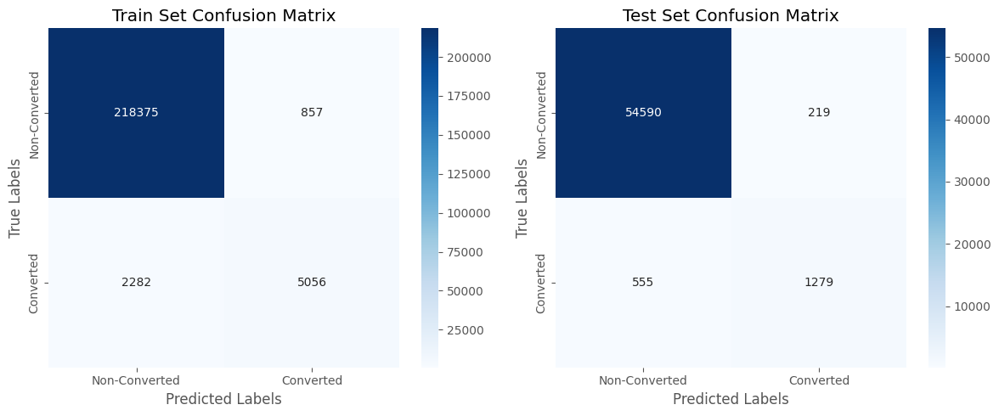

In [ ]:
plot_confusion_matrix(
    y_train, Y_train_pred_logreg,
    y_test, Y_test_pred_logreg,
    class_labels=["Non-Converted", "Converted"]
)

##**2. Optimization with GridSearch and class_weight**

##Training optimized model

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [70, 80, 90, 120, 200, 300],  # Regularization strength
    'penalty': ['l1','l2'], # L1 = Lasso (sparse), L2 = Ridge (default)
    'class_weight':[{0: 28 , 1: 38}],
    'solver': ['liblinear'],
}

# Grid Search with 5-fold Cross Validation
gridsearch = GridSearchCV(logreg_clf, param_grid, cv=5)
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [70, 80, 90, 120, 200, 300],
                         'class_weight': [{0: 28, 1: 38}],
                         'penalty': ['l1', 'l2'], 'solver': ['liblinear']})

In [ ]:
print("Predictions on training set...")
Y_train_pred_gs = gridsearch.predict(X_train)
print("...Done.")
print(Y_train_pred_gs)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]



##Testing GridSearch

In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_test_pred_gs =gridsearch.predict(X_test)
print("...Done.")
print(Y_train_pred_gs)

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]


##Performance

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print("f1-score on test set : ", f1_score(y_train, Y_train_pred_gs))
print("f1-score on test set : ", f1_score(y_test, Y_test_pred_gs))
print("Classification Report:\n", classification_report(y_test, Y_test_pred_gs))

f1-score on test set :  0.769331205570869
f1-score on test set :  0.7728715728715728
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     54809
           1       0.82      0.73      0.77      1834

    accuracy                           0.99     56643
   macro avg       0.91      0.86      0.88     56643
weighted avg       0.99      0.99      0.99     56643



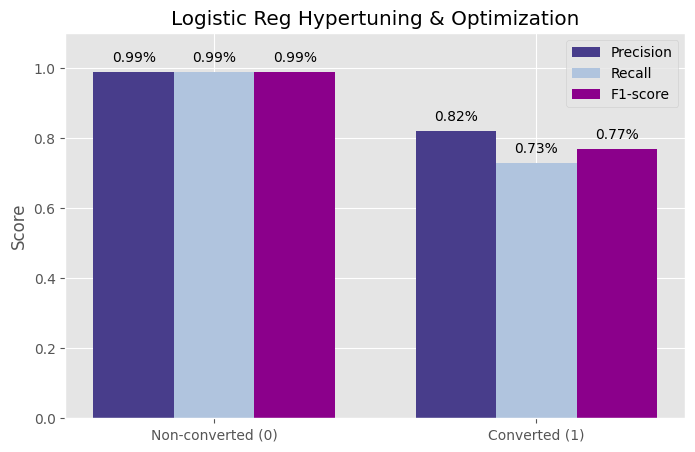

In [ ]:
# Metrics
classes = ["Non-converted (0)", "Converted (1)"]
precision = [0.99, 0.82]
recall = [0.99, 0.73]
f1 = [0.99, 0.77]

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(8,5))

# bars
bars1 = ax.bar(x - width, precision, width, label="Precision", color="darkslateblue")
bars2 = ax.bar(x, recall, width, label="Recall", color="lightsteelblue")
bars3 = ax.bar(x + width, f1, width, label="F1-score", color="darkmagenta")

# labels and layout
ax.set_ylabel("Score")
ax.set_title("Logistic Reg Hypertuning & Optimization")
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.set_ylim(0, 1.1)
ax.legend()

# show values above bars without overlap
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.02,
            f"{height:.2f}%",
            ha="center", va="bottom", fontsize=10
        )

plt.show()


##Confusion matrices of Optimized LogReg Model with GridSearch

In [ ]:
# Check performance metrics to better understand the model
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred_gs))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, Y_test_pred_gs))
print()

Confusion matrix on train set : 
[[218087   1145]
 [  2035   5303]]

Confusion matrix on test set : 
[[54517   292]
 [  495  1339]]



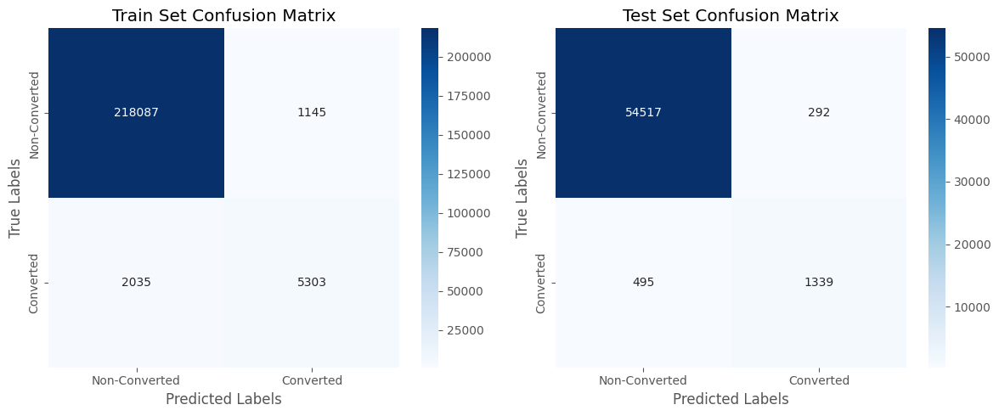

In [ ]:
plot_confusion_matrix(
    y_train, Y_train_pred_gs,
    y_test, Y_test_pred_gs,
    class_labels=["Non-Converted", "Converted"]
)

#**3. XGBoost Model**

In [ ]:
import xgboost as xgb
model_xgb = xgb.XGBClassifier()

##Train Model

In [ ]:
# Train model
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred_xgb = model_xgb.predict(X_train)

Predictions on training set...


##Testing

In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_test_pred_xgb =model_xgb.predict(X_test)
print("...Done.")
print(Y_test_pred_xgb)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]



##Model Evaluation

In [ ]:
print("XGBoost Model Accuracy:", accuracy_score(y_test, Y_test_pred_xgb))

XGBoost Model Accuracy: 0.9856292922338153


In [ ]:
# Evaluate the model
print("f1-score on train set : ", f1_score(y_train, Y_train_pred_xgb ))
print("f1-score on test set : ", f1_score(y_test, Y_test_pred_xgb))
print("Classification Report:\n", classification_report(y_test, Y_test_pred_xgb))


f1-score on train set :  0.7756482525366404
f1-score on test set :  0.756578947368421
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     54809
           1       0.84      0.69      0.76      1834

    accuracy                           0.99     56643
   macro avg       0.91      0.84      0.87     56643
weighted avg       0.98      0.99      0.98     56643



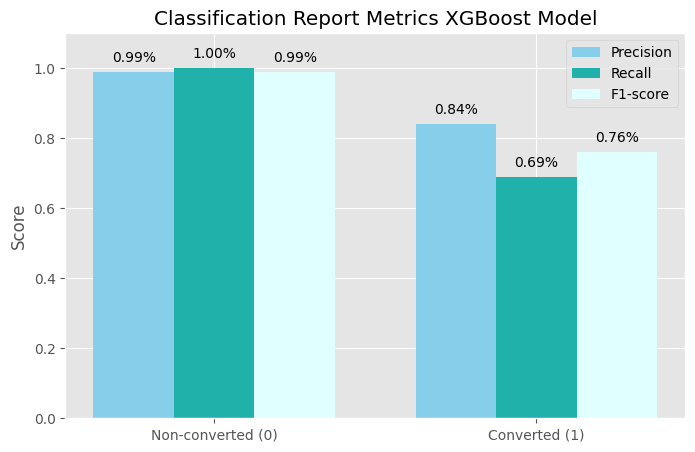

In [ ]:
# Metrics
classes = ["Non-converted (0)", "Converted (1)"]
precision = [0.99, 0.84]
recall = [1.00, 0.69]
f1 = [0.99, 0.76]

x = np.arange(len(classes))
width = 0.25

fig, ax = plt.subplots(figsize=(8,5))

# bars
bars1 = ax.bar(x - width, precision, width, label="Precision", color="skyblue")
bars2 = ax.bar(x, recall, width, label="Recall", color="lightseagreen")
bars3 = ax.bar(x + width, f1, width, label="F1-score", color="lightcyan")

# labels and layout
ax.set_ylabel("Score")
ax.set_title("Classification Report Metrics XGBoost Model")
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.set_ylim(0, 1.1)
ax.legend()

# show values above bars without overlap
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.02,
            f"{height:.2f}%",
            ha="center", va="bottom", fontsize=10
        )

plt.show()


##Confusion Matrices of XGBOOST model train and test sets

In [ ]:
# Check performance metrics to better understand the model
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred_xgb))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, Y_test_pred_xgb))
print()

Confusion matrix on train set : 
[[218425    807]
 [  2178   5160]]

Confusion matrix on test set : 
[[54564   245]
 [  569  1265]]



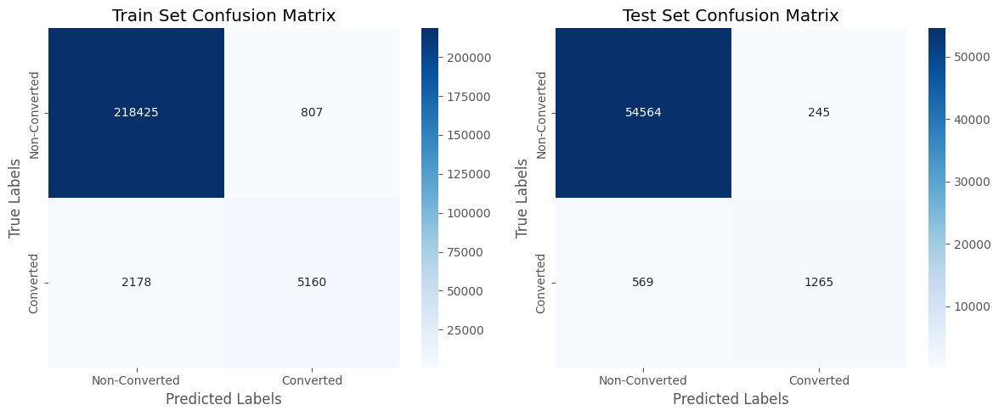

In [ ]:
plot_confusion_matrix(
    y_train, Y_train_pred_xgb,
    y_test, Y_test_pred_xgb,
    class_labels=["Non-Converted", "Converted"]
)

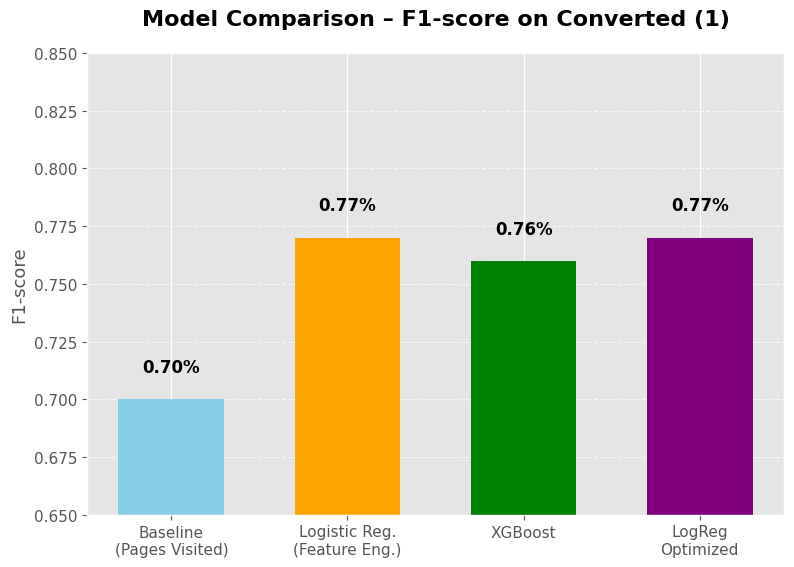

In [ ]:
# F1-score resulys on Converted
models = [
    "Baseline\n(Pages Visited)",
    "Logistic Reg.\n(Feature Eng.)",
    "XGBoost",
    "LogReg\nOptimized"
]

f1_scores = [0.70, 0.77, 0.76, 0.77]

plt.figure(figsize=(9,6))
bars = plt.bar(models, f1_scores, color=['skyblue','orange','green','purple'], width=0.6)


for bar, score in zip(bars, f1_scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f"{score:.2f}%", ha='center', va='bottom', fontsize=12, fontweight='bold', color="black")


plt.title("Model Comparison – F1-score on Converted (1)", fontsize=16, fontweight='bold', pad=20)
plt.ylabel("F1-score", fontsize=13)
plt.ylim(0.65, 0.85)


plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


#**4. Implementing VotingClassifier**

##Let's combine the three models and use VotingClassifier and implement a soft voting for weighted probabilities.

In [ ]:
from sklearn.ensemble import VotingClassifier

# Create Voting Classifier
voting_clf = VotingClassifier(
    estimators=[
        ('logreg', logreg_clf),
        ('gridsearch_lr', gridsearch),
        ('xgb', model_xgb)
    ],
    voting='soft'
)

##Train the ensemble model

In [ ]:
# Train the ensemble model
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('logreg', LogisticRegression()),
                             ('gridsearch_lr',
                              GridSearchCV(cv=5, estimator=LogisticRegression(),
                                           param_grid={'C': [70, 80, 90, 120,
                                                             200, 300],
                                                       'class_weight': [{0: 28,
                                                                         1: 38}],
                                                       'penalty': ['l1', 'l2'],
                                                       'solver': ['liblinear']})),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=No...
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...))],
                 voting='soft')

In [ ]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred_voting = voting_clf.predict(X_train)

Predictions on training set...


###Testing

In [ ]:
# Predictions
y_pred_voting = voting_clf.predict(X_test)

##Model Evaluation

In [ ]:
# Evaluate the model
print("VotingModel Accuracy:", accuracy_score(y_test, y_pred_voting))
print("f1-score on test set : ", f1_score(y_test, y_pred_voting))
print("Classification Report:\n", classification_report(y_test, y_pred_voting))

VotingModel Accuracy: 0.9863001606553325
f1-score on test set :  0.7716303708063567
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     54809
           1       0.84      0.71      0.77      1834

    accuracy                           0.99     56643
   macro avg       0.91      0.86      0.88     56643
weighted avg       0.99      0.99      0.99     56643



##Confusion matrices of VotingClassifier model's train and test sets

In [ ]:
# Check performance metrics to better understand the model
print("Confusion matrix on train set : ")
print(confusion_matrix(y_train, Y_train_pred_voting))
print()
print("Confusion matrix on test set : ")
print(confusion_matrix(y_test, y_pred_voting))
print()

Confusion matrix on train set : 
[[218302    930]
 [  2150   5186]]

Confusion matrix on test set : 
[[54556   253]
 [  523  1311]]



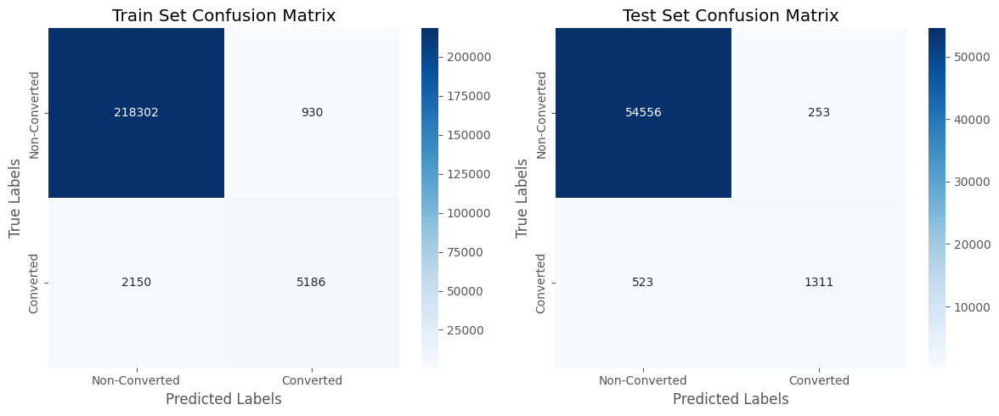

In [ ]:
plot_confusion_matrix(
    y_train, Y_train_pred_voting,
    y_test, y_pred_voting,
    class_labels=["Non-Converted", "Converted"]
)

##**Model perfomance comparaison**

In [ ]:
# Define models and their predictions
models = {
    "LogReg Feature Engineering": Y_test_pred_logreg,
    "LogReg GridSearch & class_weight": Y_test_pred_gs,
    "XGBoost Model": Y_test_pred_xgb,
    "VotingClassifier": y_pred_voting
}

# Initialize results list
results = []

# Compute metrics for each model dynamically
for model_name, y_pred in models.items():
    results.append({
        "Model": model_name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred)
    })

# Convert results to DataFrame
performance_df = pd.DataFrame(results)

# Print results
print(performance_df)


                              Model  Accuracy  F1 Score    Recall  Precision
0        LogReg Feature Engineering  0.986406  0.769461  0.700654   0.853254
1  LogReg GridSearch & class_weight  0.986265  0.776950  0.738822   0.819226
2                     XGBoost Model  0.985929  0.762868  0.699019   0.839555
3                  VotingClassifier  0.986300  0.771630  0.714831   0.838235


##**Visualization**

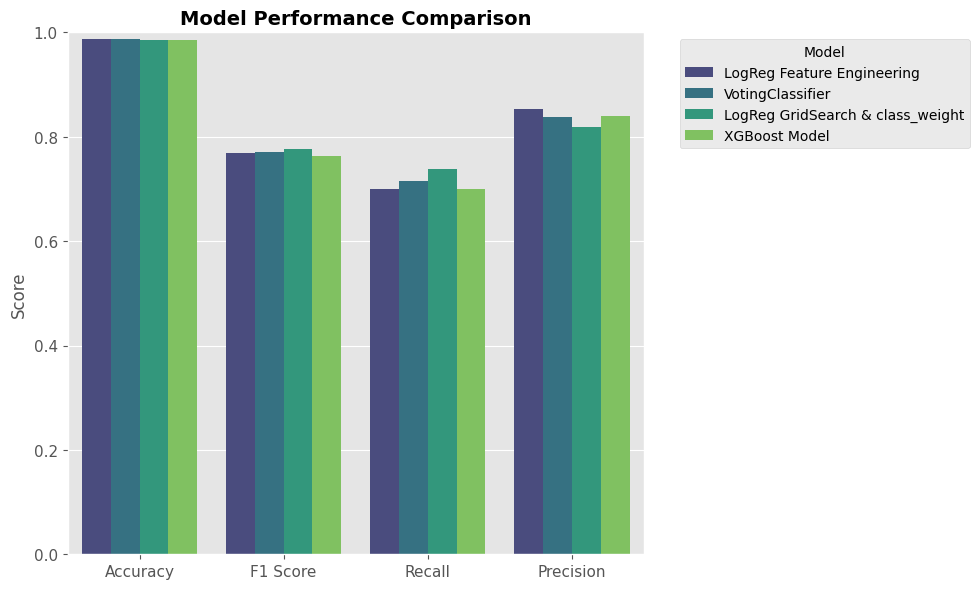

In [ ]:
# Convert results to a DataFrame
performance_df = pd.DataFrame(results)

# Sort by Accuracy
performance_df = performance_df.sort_values(by="Accuracy", ascending=False)

# Melt the DataFrame for Seaborn (long format for grouped bar plot)
df_melted = performance_df.melt(id_vars="Model", var_name="Metric", value_name="Score")

# Custom color palette
custom_palette = {
    "Accuracy": "royalblue",
    "F1 Score": "seagreen",
    "Recall": "darkorange",
    "Precision": "crimson"
}

# Plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x="Metric", y="Score", hue="Model", data=df_melted, palette="viridis")

# Formatting
plt.title("Model Performance Comparison", fontsize=14, fontweight='bold')
plt.ylabel("Score", fontsize=12)
plt.xlabel("")
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Ensure the y-axis goes from 0 to 1
plt.ylim(0, 1)

plt.tight_layout()
plt.show()

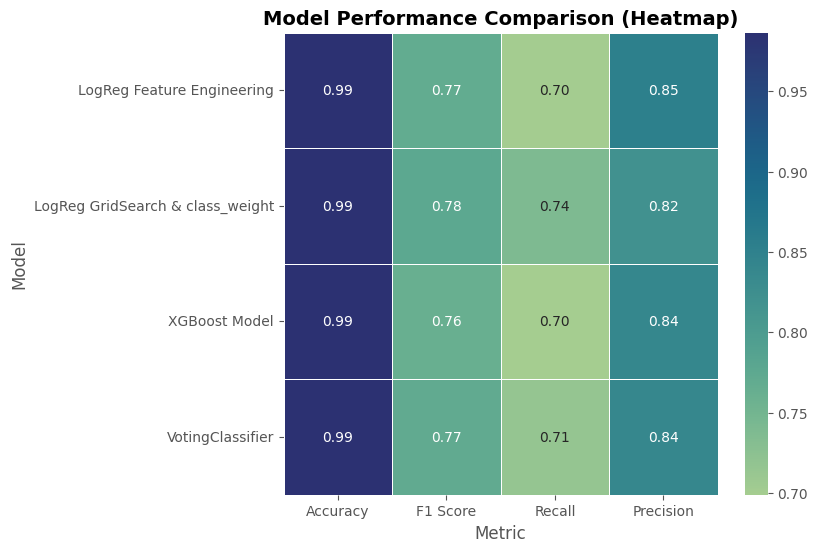

In [ ]:
# Convert results to a DataFrame
performance_df = pd.DataFrame(results)

# Set model names as the index
performance_df.set_index("Model", inplace=True)

# Create the heatmap
plt.figure(figsize=(7, 6))
sns.heatmap(performance_df, annot=True, cmap="crest", linewidths=0.5, fmt=".2f")

# Formatting
plt.title("Model Performance Comparison (Heatmap)", fontsize=14, fontweight="bold")
plt.xlabel("Metric", fontsize=12)
plt.ylabel("Model", fontsize=12)

# Show plot
plt.show()

##**Model Showdown: Which One Wins?**

1. LogReg GridSearch & Class Weight (98.63% Accuracy) → Best F1-Score (77.69%) & Recall (73.88%), meaning it catches the most positives while keeping balance.

2. LogReg Feature Engineering (98.64% Accuracy) → Highest Precision (85.33%), so it avoids false alarms, but Recall (70.07%) is a bit lower.

3.  VotingClassifier (98.63% Accuracy) → Solid across all metrics, with good Recall (71.48%) and F1-Score (77.16%), but slightly lower Precision (83.82%).

4. XGBoost (98.59% Accuracy) → High Precision (83.96%), but the lowest Recall (69.90%), meaning it plays it safe but may miss some positives.

**Final Verdict: Which one to pick?**

- Need to catch all positives? → GridSearch & Class Weight 🏆
- Hate false positives? → Feature Engineering 🎯
- Want an all-rounder? → VotingClassifier ⚖️
- Prefer conservative predictions? → XGBoost 🤖

🔥 Winner for Most Balanced Performance? → **GridSearch & Class Weight!** 🏆🚀

#**Part 3: Predictions with the file data_test.csv**

In [ ]:
# Read data without labels
data_without_labels = pd.read_csv('/content/conversion_data_test.csv')
print('Prediction set (without labels) :', data_without_labels.shape)

features_list = ['country', 'age', 'new_user', 'source', 'total_pages_visited']
X_without_labels = data_without_labels.loc[:, features_list]

Prediction set (without labels) : (31620, 5)


In [ ]:
data_without_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31620 entries, 0 to 31619
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   country              31620 non-null  object
 1   age                  31620 non-null  int64 
 2   new_user             31620 non-null  int64 
 3   source               31620 non-null  object
 4   total_pages_visited  31620 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.2+ MB


In [ ]:
# Preprocessings on train set
print("Performing preprocessings on train set...")
print(X_without_labels.head())
X_without_labels = preprocessor.fit_transform(X_without_labels)
print("...Done.")

Performing preprocessings on train set...
  country  age  new_user  source  total_pages_visited
0      UK   28         0     Seo                   16
1      UK   22         1  Direct                    5
2   China   32         1     Seo                    1
3      US   32         1     Ads                    6
4   China   25         0     Seo                    3
...Done.


In [ ]:
# Make predictions and dump to file
# WARNING : MAKE SURE THE FILE IS A CSV WITH ONE COLUMN NAMED 'converted' AND NO INDEX !
# WARNING : FILE NAME MUST HAVE FORMAT 'conversion_data_test_predictions_[name].csv'
# where [name] is the name of your team/model separated by a '-'
# For example : [name] = AURELIE-model1
data = {'converted': gridsearch.predict(X_without_labels)}

Y_predictions = pd.DataFrame(columns=['converted'],data=data)
Y_predictions.to_csv('/content/conversion_data_test_predictions_ronalyn-logreg-v2.csv', index=False)


#**Part 4 : Analyze best model's parameters**

Since LogReg GridSearch & Class Weight is our best model, let's analyze its parameters:

In [ ]:
# Print the best parameters found by GridSearchCV
print(gridsearch.best_params_)

{'C': 70, 'class_weight': {0: 28, 1: 38}, 'penalty': 'l1', 'solver': 'liblinear'}


###**Model’s Coefficients (Feature Importance)**

In [ ]:
feature_names = preprocessor.get_feature_names_out()
feature_names

array(['num__age', 'num__new_user', 'num__total_pages_visited',
       'cat__country_China', 'cat__country_Germany', 'cat__country_UK',
       'cat__country_US', 'cat__source_Ads', 'cat__source_Direct',
       'cat__source_Seo'], dtype=object)

In [ ]:
# Extract feature names
feature_names = ['num__age', 'num__new_user', 'num__total_pages_visited',
       'cat__country_China', 'cat__country_Germany', 'cat__country_UK',
       'cat__country_US', 'cat__source_Ads', 'cat__source_Direct',
       'cat__source_Seo']

# Get model coefficients
coefficients = gridsearch.best_estimator_.coef_[0]

# Create DataFrame for better visualization
coef_df = pd.DataFrame({"Feature": feature_names, "Coefficient": coefficients})
coef_df["Absolute Coef"] = coef_df["Coefficient"].abs()
coef_df = coef_df.sort_values(by="Absolute Coef", ascending=False)

# Display feature importance
print(coef_df)

                    Feature  Coefficient  Absolute Coef
3        cat__country_China    -4.629672       4.629672
8        cat__source_Direct    -2.939698       2.939698
9           cat__source_Seo    -2.812475       2.812475
7           cat__source_Ads    -2.753075       2.753075
2  num__total_pages_visited     2.537539       2.537539
6           cat__country_US    -1.309175       1.309175
5           cat__country_UK    -0.980554       0.980554
1             num__new_user    -0.808914       0.808914
4      cat__country_Germany    -0.737593       0.737593
0                  num__age    -0.597316       0.597316


In [ ]:
# Feature Important and sort coefficients
coef_df_sorted = coef_df.sort_values(by='Coefficient', ascending=False)

fig = px.bar(
    coef_df_sorted,
    x='Coefficient',
    y='Feature',
    orientation='h',
    color='Feature'

)

# Add vertical line at x=0
fig.add_shape(
    type='line',
    x0=0, x1=0, y0=-0.5, y1=len(coef_df_sorted) - 0.5,
    line=dict(color='black', dash='dash')
)

fig.update_layout(
    title='Feature Importance (Logistic Regression Coefficients)',
    xaxis_title='Coefficient Value',
    yaxis_title='Feature',
    showlegend=False,
    margin=dict(l=100, r=40, t=60, b=40),
    height=400 + 20 * len(coef_df_sorted),
    font=dict(size=12),
)

fig.show()


#**Key Insights from Absolute Coefficients**

**Features:**

- cat_country_China : -4.79 - Strongly decreases conversion likelihood.
- cat_source_Direct : -3.05 - Users coming from Direct Traffic convert much less.
- cat_source_Seo : -2.92 - Ads aren't leading to conversions effectively.
- num_total_pages_visited: 2.54 - More pages visited increases conversion probability.
- cat_country_US : - 1.47 US - US visitors convert less than other countries.
- cat_country_UK : - 1.14 - UK visitors also convert less.
- cat_country_Germany: - 0.90 - German visitors have a slight negative effect on conversion.
- num_new_user : - 0.81 - New users convert less than returning users.
- num_age : - 0.60 - Older users convert slightly less.

#**Business Recommendations Based on the Model**

✅ Improve Conversion for China & US Visitors

- Localize content for these regions.
- Consider region-specific offers or promotions.

✅ Optimize Ad & SEO Campaigns: Since Ads & SEO users convert less, analyze why:
- Are ads targeting the wrong audience?
- Is SEO traffic not landing on the right pages?
- A/B test new ad messaging or landing pages.

✅ Increase Engagement for Direct Traffic Users

- Offer personalized incentives (e.g., discounts or pop-ups for direct visitors).
- Improve navigation so users engage with more pages.

✅ Encourage More Page Visits

- The only positive coefficient (total_pages_visited = +2.54) shows that users who explore more convert better.
- Design better content flow to encourage browsing.

✅ Focus on Returning Users

- New users convert less than existing ones → Retarget them!
- Use email marketing or incentives for first-time visitors.